In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn 


In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')



/home/lijunma/anaconda3/envs/RNAseq/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.22.4 scipy==1.8.1 pandas==1.4.3 scikit-learn==1.1.1 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.7


In [3]:
adata=sc.read_10x_h5('GSM07.h5')

reading GSM07.h5
 (0:00:00)


/home/lijunma/anaconda3/envs/RNAseq/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
adata.var_names_make_unique() 

In [5]:
adata.shape

(3466, 33694)

In [6]:
adata.obs

""
AAACCTGAGACTAGGC-1
AAACCTGAGAGCTGGT-1
AAACCTGCAGTGGAGT-1
AAACCTGCATTCCTGC-1
AAACCTGTCACTTCAT-1
...
TTTGTCAGTCACACGC-1
TTTGTCAGTCCAGTTA-1
TTTGTCAGTTCGTCTC-1
TTTGTCATCACTTACT-1


In [7]:
results_file = 'write_185/gsm_kidney.h5ad'  # the file that will store the analysis results



In [5]:
#adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

In [8]:
adata

AnnData object with n_obs × n_vars = 3466 × 33694
    var: 'gene_ids'

In [9]:
adata.var

,gene_ids
RP11-34P13.3,ENSG00000243485
FAM138A,ENSG00000237613
OR4F5,ENSG00000186092
RP11-34P13.7,ENSG00000238009
RP11-34P13.8,ENSG00000239945
...,...
AC233755.2,ENSG00000277856
AC233755.1,ENSG00000275063
AC240274.1,ENSG00000271254
AC213203.1,ENSG00000277475


normalizing counts per cell
    finished (0:00:00)


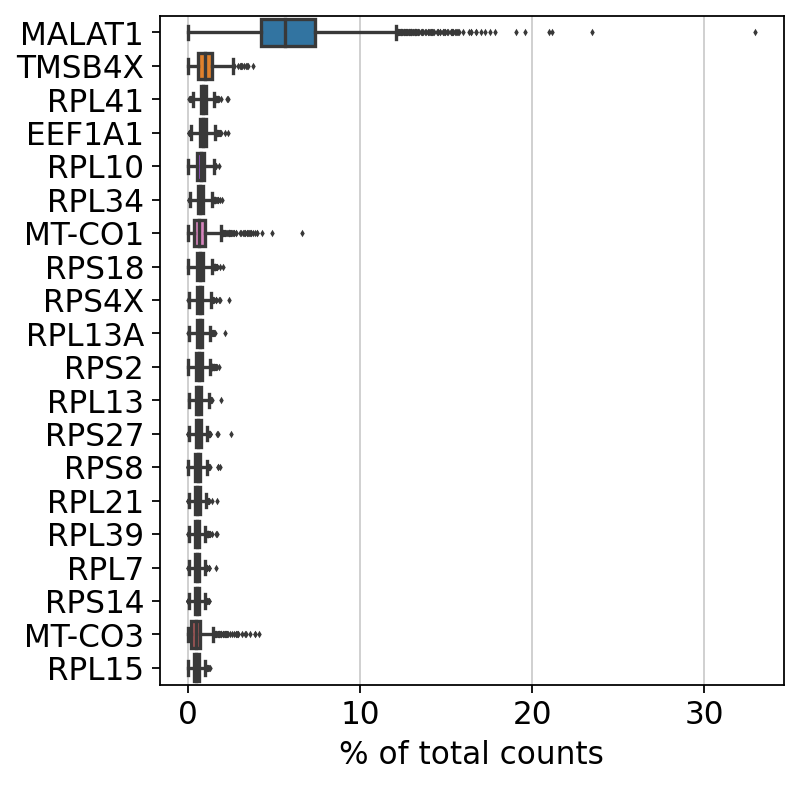

In [10]:
sc.pl.highest_expr_genes(adata, n_top=20, )



In [11]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 14480 genes that are detected in less than 3 cells


In [12]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

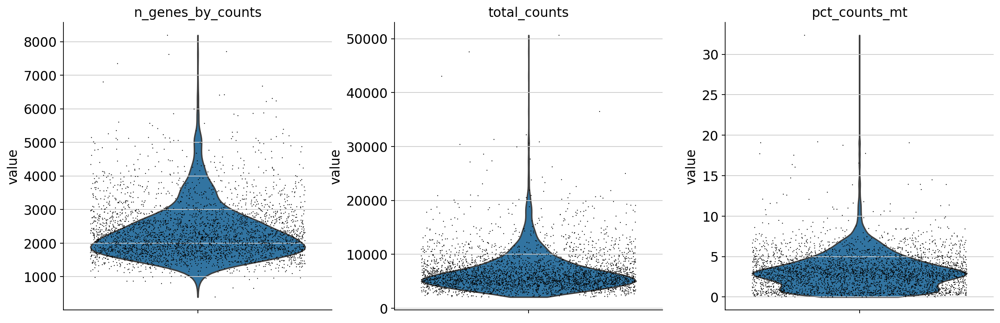

In [13]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

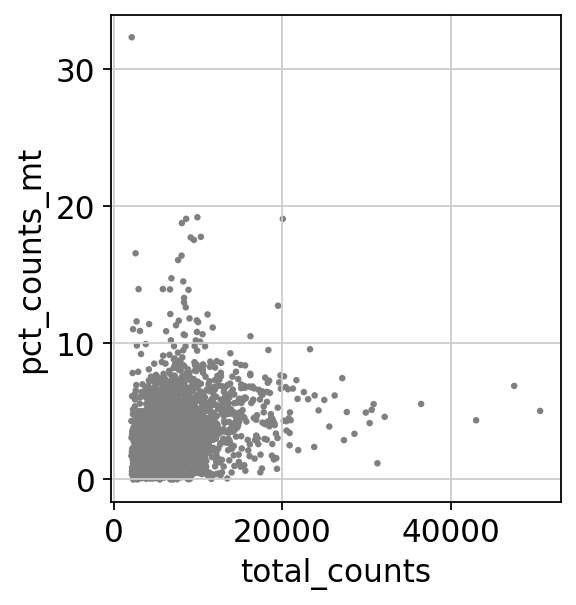

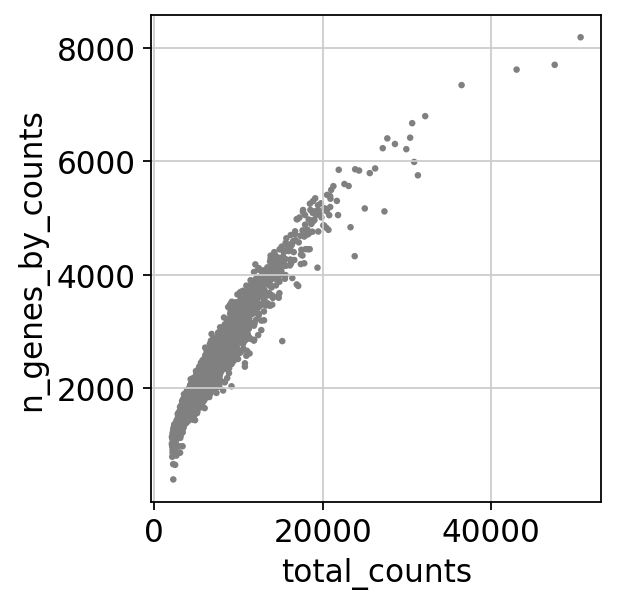

In [14]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')



In [15]:
adata = adata[adata.obs.n_genes_by_counts < 30000, :]
adata = adata[adata.obs.pct_counts_mt < 20, :]



In [16]:
sc.pp.normalize_total(adata, target_sum=3e4)

normalizing counts per cell
    finished (0:00:00)


/home/lijunma/anaconda3/envs/RNAseq/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [17]:
sc.pp.log1p(adata)

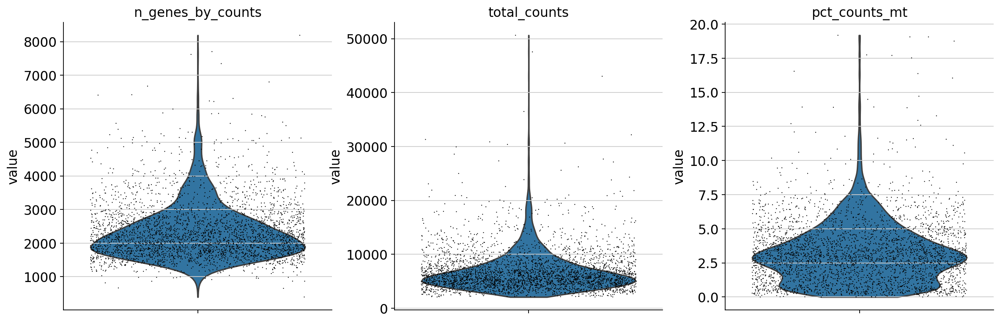

In [18]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [19]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)



extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


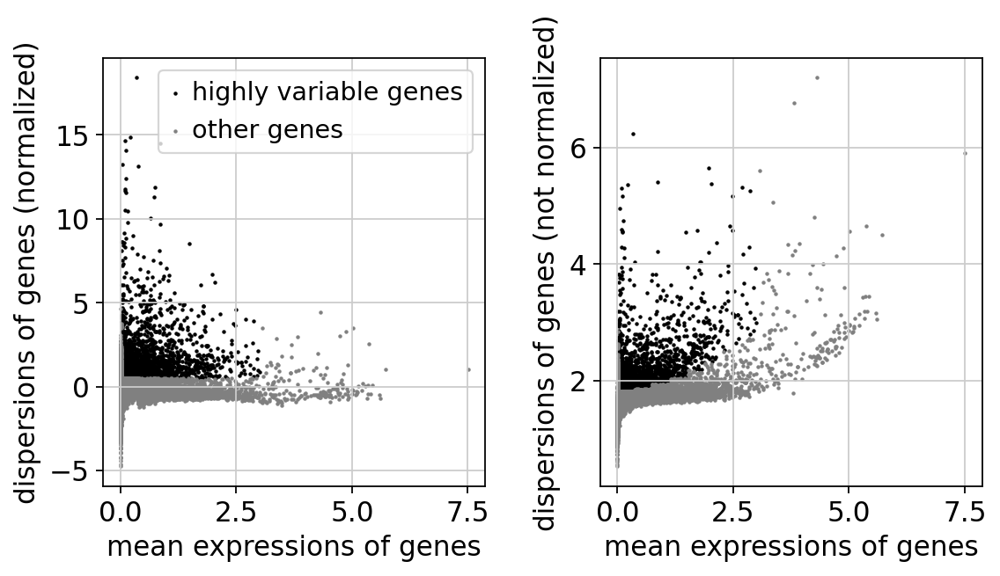

In [20]:
sc.pl.highly_variable_genes(adata)



In [21]:
adata.raw = adata

In [22]:
adata = adata[:, adata.var.highly_variable]


In [23]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])



regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:15)


In [24]:
sc.pp.scale(adata, max_value=10)

In [25]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


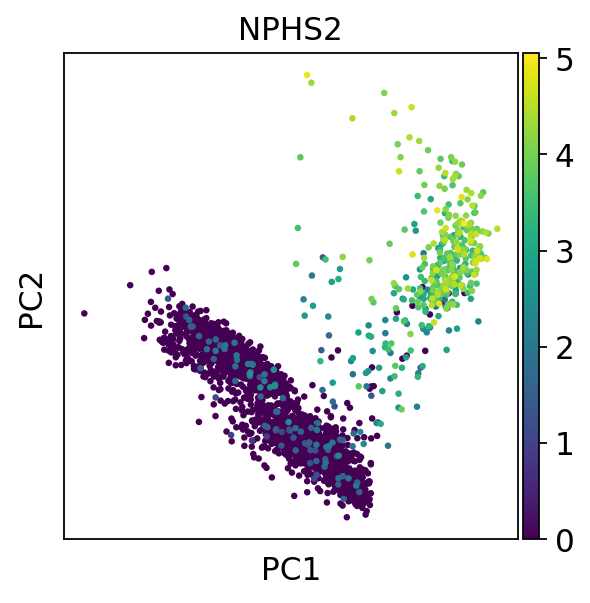

In [26]:
sc.pl.pca(adata, color='NPHS2')



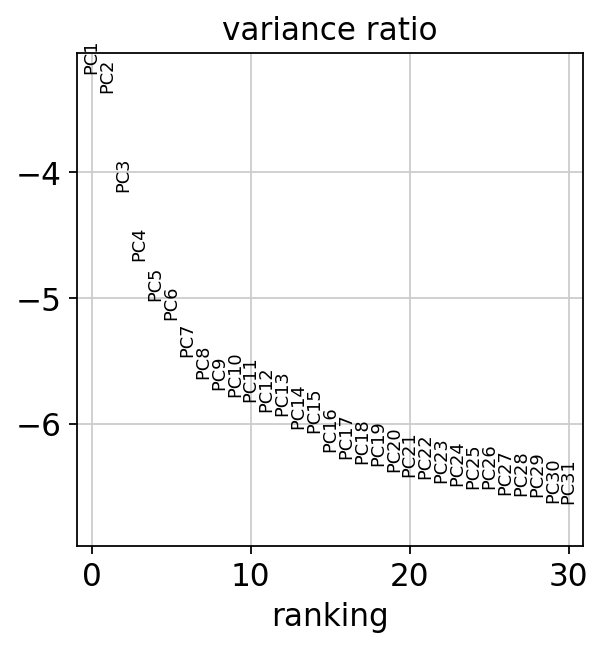

In [27]:
sc.pl.pca_variance_ratio(adata, log=True)



In [28]:
adata.write(results_file)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15)


computing neighbors
    using 'X_pca' with n_pcs = 15
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


In [29]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


In [30]:
#import leidenalg

In [30]:
#sc.tl.leiden(adata, resolution=1)

running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [30]:
adata


AnnData object with n_obs × n_vars = 3465 × 2799
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [31]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15)

computing neighbors
    using 'X_pca' with n_pcs = 15
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [32]:
sc.tl.umap(adata)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


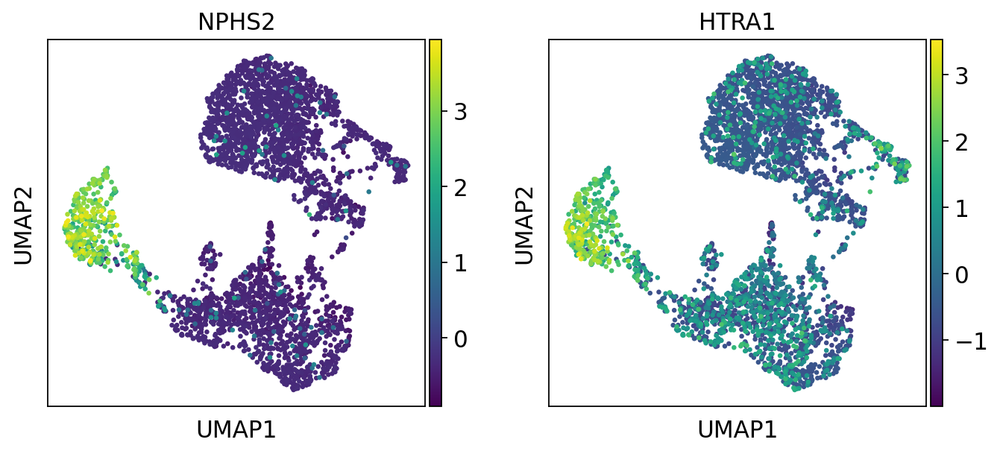

In [33]:
sc.pl.umap(adata, color=['NPHS2','HTRA1'], use_raw=False)

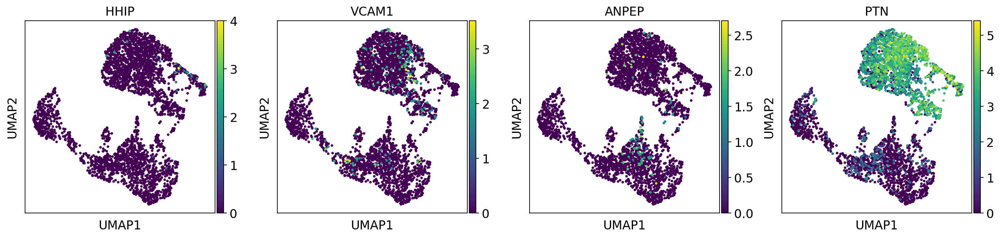

In [34]:
sc.pl.umap(adata, color=['HHIP', 'VCAM1', 'ANPEP','PTN'])

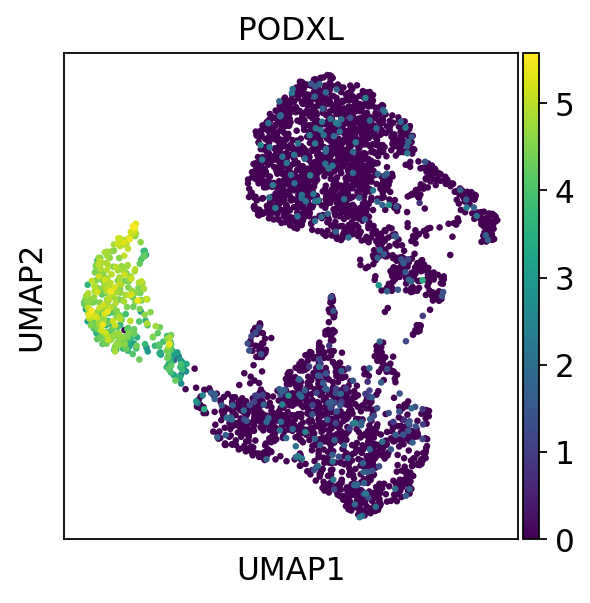

In [35]:
sc.pl.umap(adata, color=['PODXL'])

In [37]:
#sc.tl.leiden(adata)



running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [36]:
sc.tl.leiden(adata, key_added = "leiden_1.0") # default resolution in 1.0
sc.tl.leiden(adata, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(adata, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata, resolution = 1.4, key_added = "leiden_1.4")
sc.tl.leiden(adata, resolution = 0.2, key_added = "leiden_0.2")
sc.tl.leiden(adata, resolution = 0.1, key_added = "leiden_0.1")

running Leiden clustering
    finished: found 17 clusters and added
    'leiden_1.0', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 23 clusters and added
    'leiden_1.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:00)


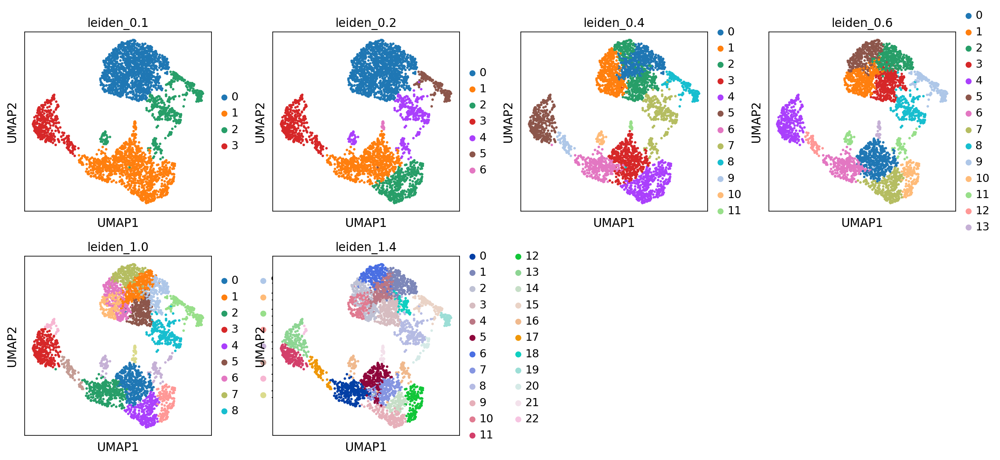

In [37]:
sc.pl.umap(adata, color=['leiden_0.1','leiden_0.2','leiden_0.4', 'leiden_0.6', 'leiden_1.0','leiden_1.4'])


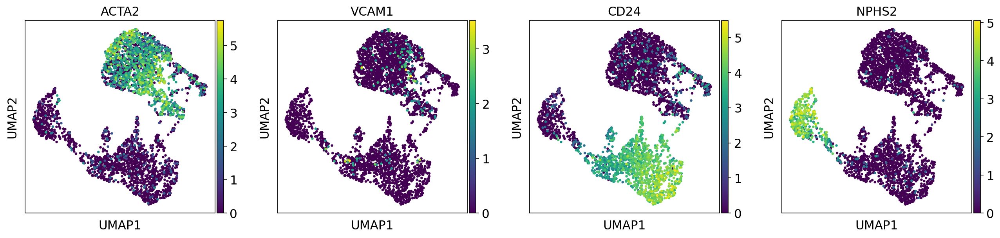

In [38]:
sc.pl.umap(adata, color=['ACTA2', 'VCAM1', 'CD24', 'NPHS2'])

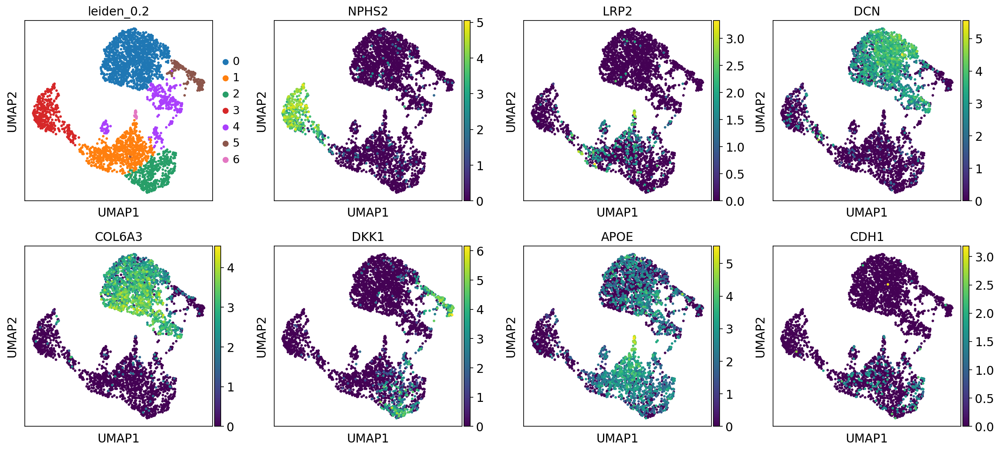

In [61]:
sc.pl.umap(adata, color=['leiden_0.2', 'NPHS2','LRP2','DCN','COL6A3','DKK1','APOE','CDH1'])

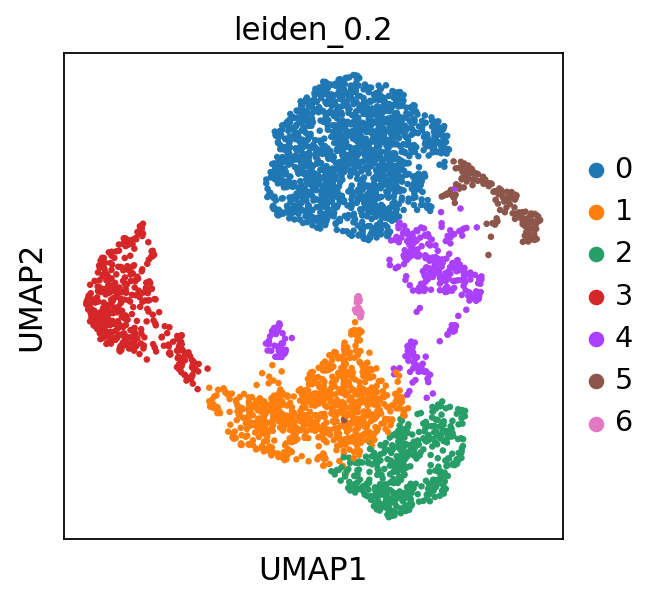

In [45]:
sc.pl.umap(adata, color=['leiden_0.2'])

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


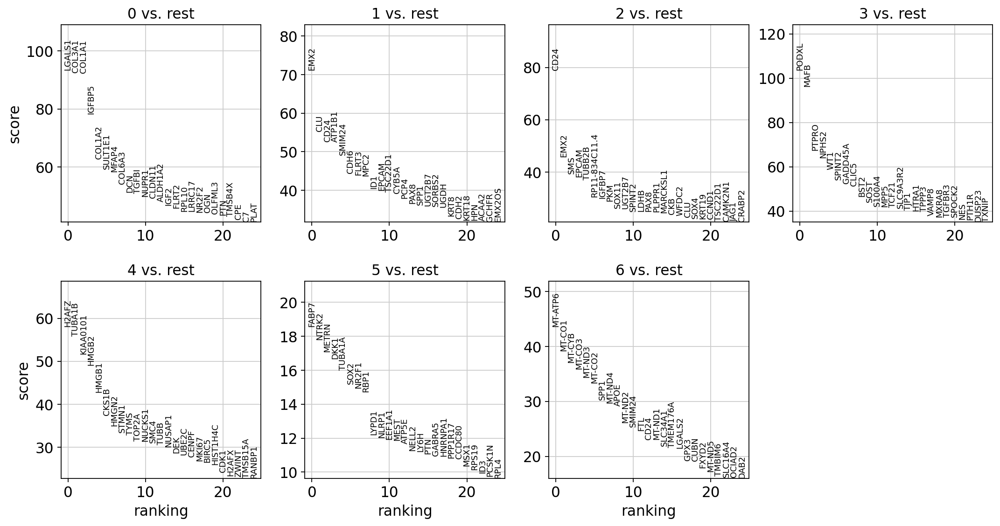

In [46]:
sc.tl.rank_genes_groups(adata, 'leiden_0.2', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [47]:
sc.settings.verbosity = 2  # reduce the verbosity

ranking genes
    finished (0:00:03)


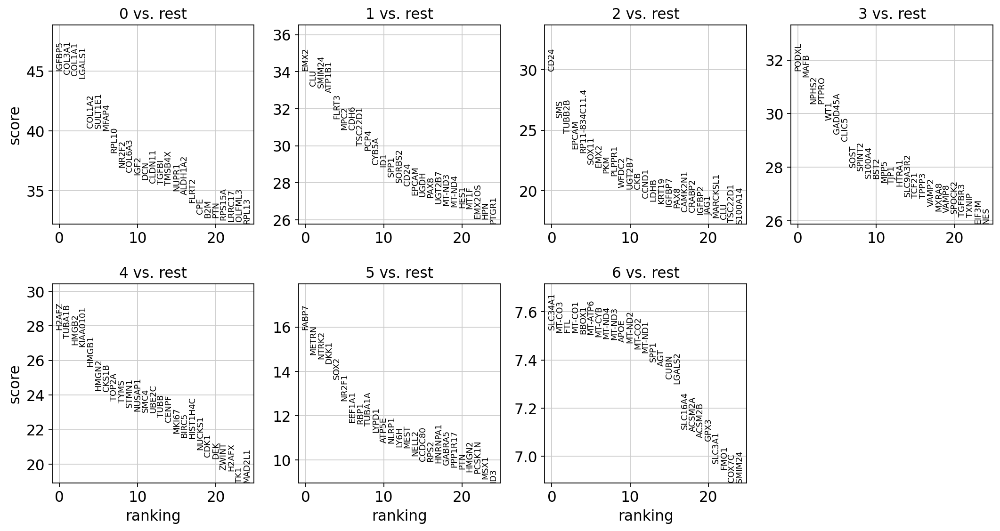

In [48]:
sc.tl.rank_genes_groups(adata, 'leiden_0.2', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)


In [49]:
adata.write(results_file)

In [68]:
#marker_genes = ['HHIP', 'VCAM1', 'ANPEP', 'RAB25', 'NPHS2', 'PODXL', 'PECAM1', 'C1QA','MTRNR2L12']

In [50]:
adata = sc.read(results_file)



In [51]:
adata

AnnData object with n_obs × n_vars = 3465 × 2799
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4', 'leiden_0.2', 'leiden_0.1'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_0.1_colors', 'leiden_0.2_colors', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.4_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [52]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)

,0,1,2,3,4,5,6
0,IGFBP5,EMX2,CD24,PODXL,H2AFZ,FABP7,SLC34A1
1,COL3A1,CLU,SMS,MAFB,TUBA1B,METRN,MT-CO3
2,COL1A1,SMIM24,TUBB2B,NPHS2,HMGB2,NTRK2,FTL
3,LGALS1,ATP1B1,EPCAM,PTPRO,KIAA0101,DKK1,MT-CO1
4,COL1A2,FLRT3,RP11-834C11.4,WT1,HMGB1,SOX2,BBOX1
5,SULT1E1,MPC2,SOX11,GADD45A,HMGN2,NR2F1,MT-ATP6
6,MFAP4,CDH6,EMX2,CLIC5,CKS1B,EEF1A1,MT-CYB
7,RPL10,TSC22D1,PKM,SOST,TOP2A,RBP1,MT-ND4
8,NR2F2,PCP4,PLPPR1,SPINT2,TYMS,TUBA1A,MT-ND3
9,COL6A3,CYB5A,WFDC2,S100A4,STMN1,LYPD1,APOE


In [53]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(20)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,5_n,5_p,6_n,6_p
0,IGFBP5,0.000000e+00,EMX2,3.855227e-254,CD24,1.667050e-196,PODXL,3.666681e-219,H2AFZ,6.040086e-170,FABP7,7.788584e-57,SLC34A1,5.224601e-14
1,COL3A1,0.000000e+00,CLU,2.144792e-242,SMS,1.950986e-149,MAFB,5.013253e-216,TUBA1B,6.668646e-164,METRN,2.395978e-49,MT-CO3,5.694881e-14
2,COL1A1,0.000000e+00,SMIM24,1.334142e-240,TUBB2B,1.435913e-135,NPHS2,1.450816e-202,HMGB2,2.308461e-159,NTRK2,4.075236e-48,FTL,5.694881e-14
3,LGALS1,0.000000e+00,ATP1B1,4.368527e-237,EPCAM,2.035093e-121,PTPRO,1.802375e-202,KIAA0101,3.186210e-158,DKK1,1.180393e-46,MT-CO1,5.745147e-14
4,COL1A2,0.000000e+00,FLRT3,2.834981e-217,RP11-834C11.4,1.406897e-118,WT1,1.447520e-194,HMGB1,4.862895e-145,SOX2,1.750683e-42,BBOX1,5.961070e-14
5,SULT1E1,0.000000e+00,MPC2,2.298689e-209,SOX11,2.055089e-109,GADD45A,4.072871e-188,HMGN2,4.983532e-130,NR2F1,8.029078e-37,MT-ATP6,6.077337e-14
6,MFAP4,0.000000e+00,CDH6,3.650551e-209,EMX2,9.453481e-107,CLIC5,1.305752e-184,CKS1B,1.715431e-129,EEF1A1,1.392167e-31,MT-CYB,6.530668e-14
7,RPL10,0.000000e+00,TSC22D1,7.708271e-198,PKM,4.059263e-102,SOST,2.162116e-172,TOP2A,8.399159e-124,RBP1,2.506051e-31,MT-ND4,6.956011e-14
8,NR2F2,1.285178e-298,PCP4,1.166329e-194,PLPPR1,4.450945e-100,SPINT2,5.043323e-171,TYMS,1.219202e-122,TUBA1A,7.600784e-31,MT-ND3,7.191359e-14
9,COL6A3,7.721957e-293,CYB5A,7.632761e-185,WFDC2,2.765521e-91,S100A4,1.198238e-167,STMN1,6.646242e-120,LYPD1,2.130063e-29,APOE,7.672351e-14


In [58]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
dataframe = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','logfoldchanges','pvals_adj']}).head(60)

In [59]:
dataframe

,0_n,0_l,0_p,1_n,1_l,1_p,2_n,2_l,2_p,3_n,...,3_p,4_n,4_l,4_p,5_n,5_l,5_p,6_n,6_l,6_p
0,IGFBP5,5.072577,0.000000e+00,EMX2,4.621220,7.407434e-250,CD24,5.009757,3.203070e-192,PODXL,...,7.045160e-215,H2AFZ,2.962273,1.160542e-165,FABP7,8.543877,7.482492e-53,SLC34A1,11.232981,1.390268e-10
1,COL3A1,5.519670,0.000000e+00,CLU,4.173790,2.060502e-238,SMS,3.222755,1.874312e-145,MAFB,...,4.816232e-212,TUBA1B,3.141645,6.406568e-160,METRN,3.915198,1.534544e-45,MT-CO3,3.126229,1.390268e-10
2,COL1A1,5.364039,0.000000e+00,SMIM24,4.844419,8.544732e-237,TUBB2B,3.145203,9.196541e-132,NPHS2,...,8.657710e-199,HMGB2,4.917055,1.478492e-155,NTRK2,4.232276,1.957540e-44,FTL,2.668439,1.390268e-10
3,LGALS1,5.786326,0.000000e+00,ATP1B1,3.764969,2.098422e-233,EPCAM,3.290385,7.820457e-118,PTPRO,...,8.657710e-199,KIAA0101,5.732737,1.530496e-154,DKK1,5.605263,4.536014e-43,MT-CO1,2.769613,1.390268e-10
4,COL1A2,4.251709,0.000000e+00,FLRT3,3.976787,1.089426e-213,RP11-834C11.4,3.012454,4.505353e-115,WT1,...,5.562530e-191,HMGB1,1.801771,1.868713e-141,SOX2,5.952675,5.606270e-39,BBOX1,9.770175,1.390268e-10
5,SULT1E1,4.168371,0.000000e+00,MPC2,3.057767,7.361169e-206,SOX11,4.066946,5.640925e-106,GADD45A,...,1.304269e-184,HMGN2,1.930039,1.595893e-126,NR2F1,2.483076,2.203867e-33,MT-ATP6,3.122306,1.390268e-10
6,MFAP4,4.029260,0.000000e+00,CDH6,3.953047,1.002024e-205,EMX2,3.691796,2.270490e-103,CLIC5,...,3.584101e-181,CKS1B,3.547075,4.708614e-126,EEF1A1,0.432587,2.431737e-28,MT-CYB,2.907990,1.390268e-10
7,RPL10,0.724467,0.000000e+00,TSC22D1,2.248785,1.851334e-194,PKM,2.058261,8.666076e-99,SOST,...,3.776626e-169,TOP2A,7.252496,2.017268e-120,RBP1,1.682523,4.012606e-28,MT-ND4,2.672269,1.390268e-10
8,NR2F2,2.463497,2.469340e-295,PCP4,4.785559,2.489984e-191,PLPPR1,4.398903,8.552046e-97,SPINT2,...,6.921601e-168,TYMS,4.892725,2.602861e-119,TUBA1A,1.936749,1.043153e-27,MT-ND3,3.198381,1.390268e-10
9,COL6A3,4.540416,1.348815e-289,CYB5A,2.956970,1.466559e-181,WFDC2,3.680542,4.428060e-88,S100A4,...,1.438935e-164,STMN1,1.654193,1.277009e-116,LYPD1,3.729119,2.728469e-26,APOE,5.448154,1.390268e-10


In [60]:
df1=dataframe.iloc[:, [0,1,2,3,4,5,6,7,8]]
df1

,0_n,0_l,0_p,1_n,1_l,1_p,2_n,2_l,2_p
0,IGFBP5,5.072577,0.000000e+00,EMX2,4.621220,7.407434e-250,CD24,5.009757,3.203070e-192
1,COL3A1,5.519670,0.000000e+00,CLU,4.173790,2.060502e-238,SMS,3.222755,1.874312e-145
2,COL1A1,5.364039,0.000000e+00,SMIM24,4.844419,8.544732e-237,TUBB2B,3.145203,9.196541e-132
3,LGALS1,5.786326,0.000000e+00,ATP1B1,3.764969,2.098422e-233,EPCAM,3.290385,7.820457e-118
4,COL1A2,4.251709,0.000000e+00,FLRT3,3.976787,1.089426e-213,RP11-834C11.4,3.012454,4.505353e-115
5,SULT1E1,4.168371,0.000000e+00,MPC2,3.057767,7.361169e-206,SOX11,4.066946,5.640925e-106
6,MFAP4,4.029260,0.000000e+00,CDH6,3.953047,1.002024e-205,EMX2,3.691796,2.270490e-103
7,RPL10,0.724467,0.000000e+00,TSC22D1,2.248785,1.851334e-194,PKM,2.058261,8.666076e-99
8,NR2F2,2.463497,2.469340e-295,PCP4,4.785559,2.489984e-191,PLPPR1,4.398903,8.552046e-97
9,COL6A3,4.540416,1.348815e-289,CYB5A,2.956970,1.466559e-181,WFDC2,3.680542,4.428060e-88


In [62]:
df2=dataframe.iloc[:, [9,10,11,12,13,14,15,16,17,18,19,20]]
df2

,3_n,3_l,3_p,4_n,4_l,4_p,5_n,5_l,5_p,6_n,6_l,6_p
0,PODXL,8.857248,7.045160e-215,H2AFZ,2.962273,1.160542e-165,FABP7,8.543877,7.482492e-53,SLC34A1,11.232981,1.390268e-10
1,MAFB,5.981358,4.816232e-212,TUBA1B,3.141645,6.406568e-160,METRN,3.915198,1.534544e-45,MT-CO3,3.126229,1.390268e-10
2,NPHS2,9.030946,8.657710e-199,HMGB2,4.917055,1.478492e-155,NTRK2,4.232276,1.957540e-44,FTL,2.668439,1.390268e-10
3,PTPRO,8.497413,8.657710e-199,KIAA0101,5.732737,1.530496e-154,DKK1,5.605263,4.536014e-43,MT-CO1,2.769613,1.390268e-10
4,WT1,5.295899,5.562530e-191,HMGB1,1.801771,1.868713e-141,SOX2,5.952675,5.606270e-39,BBOX1,9.770175,1.390268e-10
5,GADD45A,6.382878,1.304269e-184,HMGN2,1.930039,1.595893e-126,NR2F1,2.483076,2.203867e-33,MT-ATP6,3.122306,1.390268e-10
6,CLIC5,9.301745,3.584101e-181,CKS1B,3.547075,4.708614e-126,EEF1A1,0.432587,2.431737e-28,MT-CYB,2.907990,1.390268e-10
7,SOST,10.219473,3.776626e-169,TOP2A,7.252496,2.017268e-120,RBP1,1.682523,4.012606e-28,MT-ND4,2.672269,1.390268e-10
8,SPINT2,3.456475,6.921601e-168,TYMS,4.892725,2.602861e-119,TUBA1A,1.936749,1.043153e-27,MT-ND3,3.198381,1.390268e-10
9,S100A4,6.344272,1.438935e-164,STMN1,1.654193,1.277009e-116,LYPD1,3.729119,2.728469e-26,APOE,5.448154,1.390268e-10


In [65]:
adata

AnnData object with n_obs × n_vars = 3465 × 2799
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4', 'leiden_0.2', 'leiden_0.1', 'leiden_0.15'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_0.15_colors', 'leiden_0.1_colors', 'leiden_0.2_colors', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.4_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [59]:
#sc.tl.rank_genes_groups(adata, 'leiden', groups=['0'], reference='1', method='wilcoxon')
#sc.pl.rank_genes_groups(adata, groups=['0'], n_genes=20)

ranking genes


KeyError: 'base'

In [63]:
adata = sc.read(results_file)


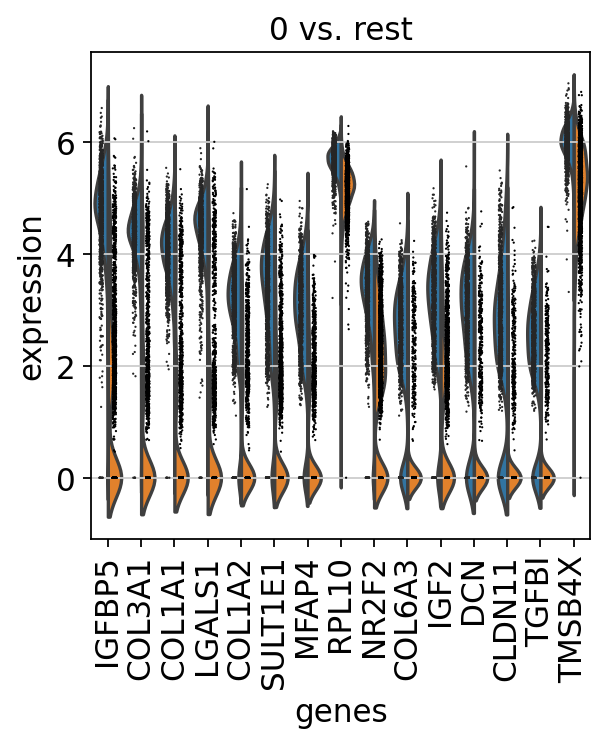

In [64]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=15, scale = 'width')

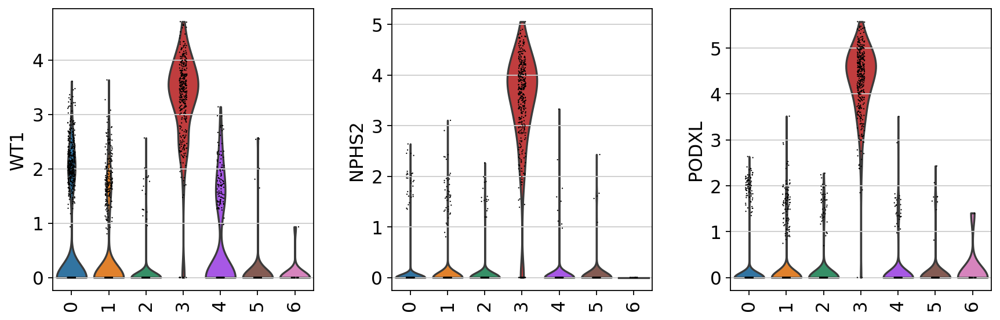

In [68]:
sc.pl.violin(adata, ['WT1', 'NPHS2', 'PODXL'], groupby='leiden_0.2', rotation = 90)

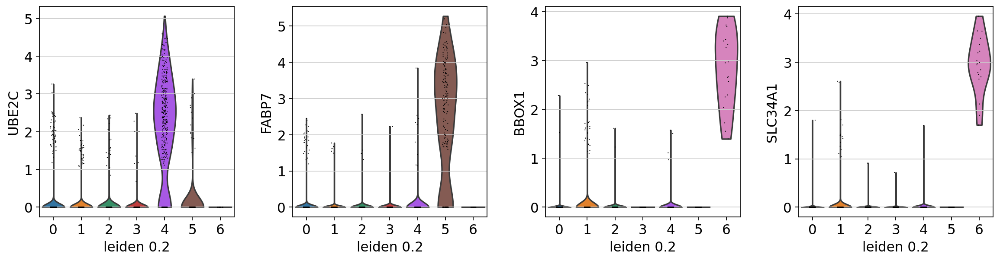

In [79]:
sc.pl.violin(adata, ['UBE2C', 'FABP7','BBOX1','SLC34A1'], groupby='leiden_0.2')

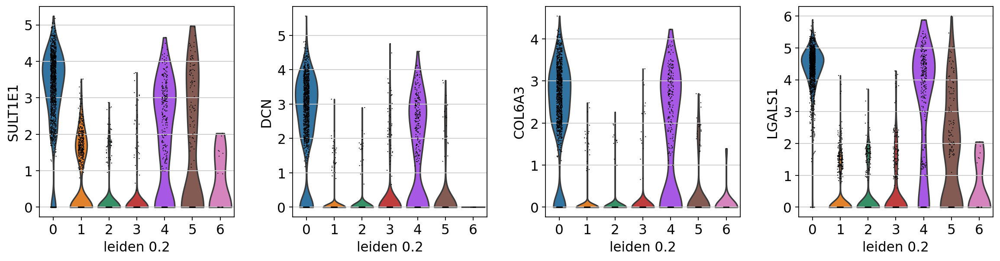

In [76]:
sc.pl.violin(adata, ['SULT1E1', 'DCN','COL6A3', 'LGALS1'], groupby='leiden_0.2') #group 0 stomal cells/mesangial cells

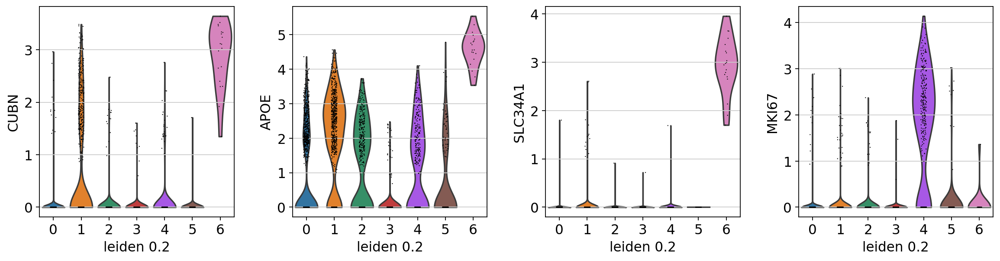

In [79]:
sc.pl.violin(adata, ['CUBN','APOE','SLC34A1','MKI67'], groupby='leiden_0.2') #GROUP 4 proliferation; group 6 proximal tubule cells

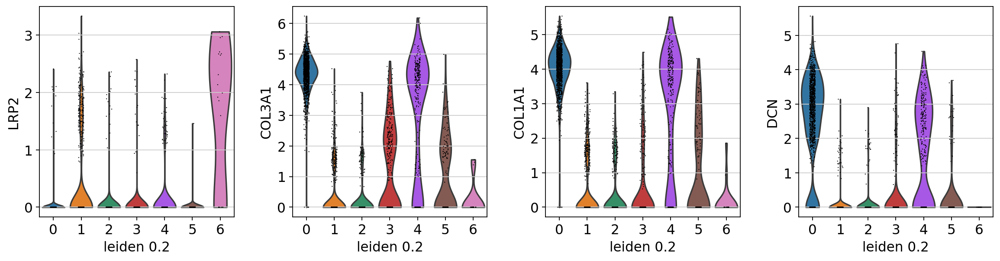

In [85]:
sc.pl.violin(adata, ['LRP2','COL3A1','COL1A1','DCN'], groupby='leiden_0.2') # GROUP 6 proximal tubule; group 0,4 renal stromal cells

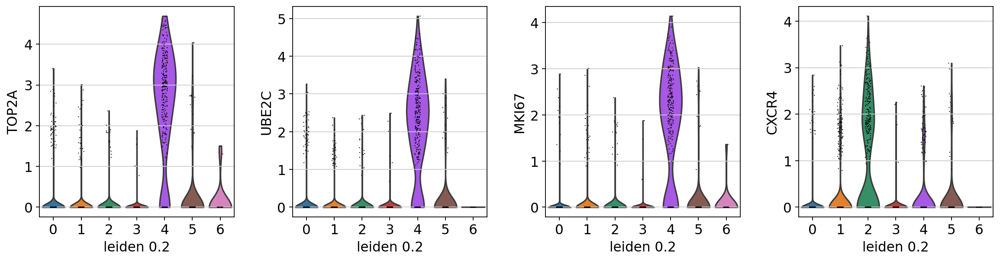

In [111]:
sc.pl.violin(adata, ['TOP2A','UBE2C','MKI67','CXCR4'], groupby='leiden_0.2') #Group4 differntiation; Group2 endothelial precursor

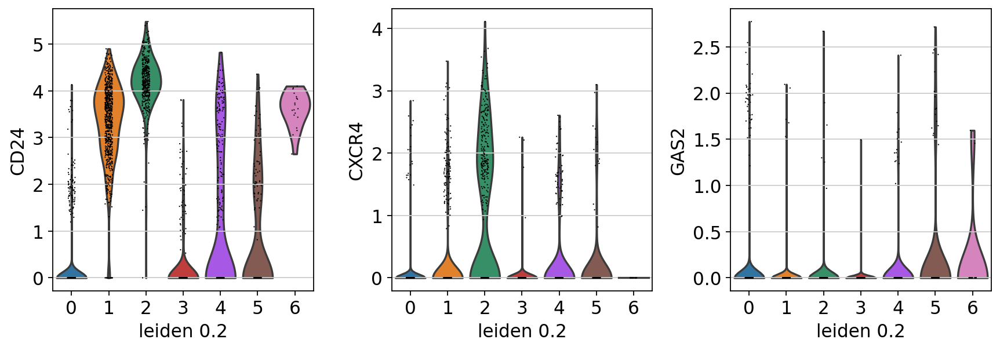

In [114]:
sc.pl.violin(adata, ['CD24','CXCR4'], groupby='leiden_0.2') #endothelial precursor

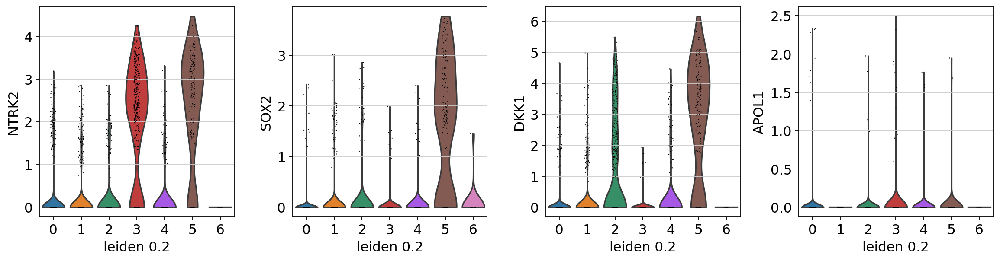

In [132]:
sc.pl.violin(adata, ['NTRK2','SOX2','DKK1'], groupby='leiden_0.2') #Neuron precursor cells

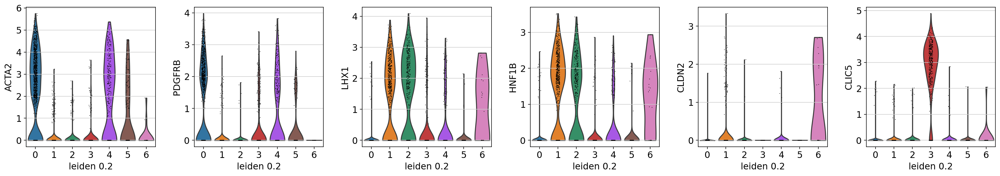

In [133]:
sc.pl.violin(adata, ['ACTA2','PDGFRB','LHX1','HNF1B','CLDN2','CLIC5'], groupby='leiden_0.2') #see Dutch leiden paper

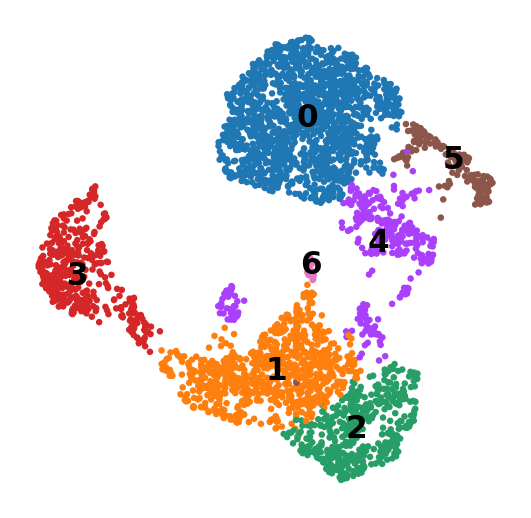

In [112]:
sc.pl.umap(adata, color='leiden_0.2', legend_loc='on data', title='', frameon=False, save='original.pdf')



In [80]:
marker_genes = ['LGALS1','EMX2','SMIM24','CD24','NPHS2','PODXL','WT1','TUBA1B','UBE2C','FABP7','BBOX1','SLC34A1','VCAM1','ANPEP','SLC7A7','THY1','RAB25']

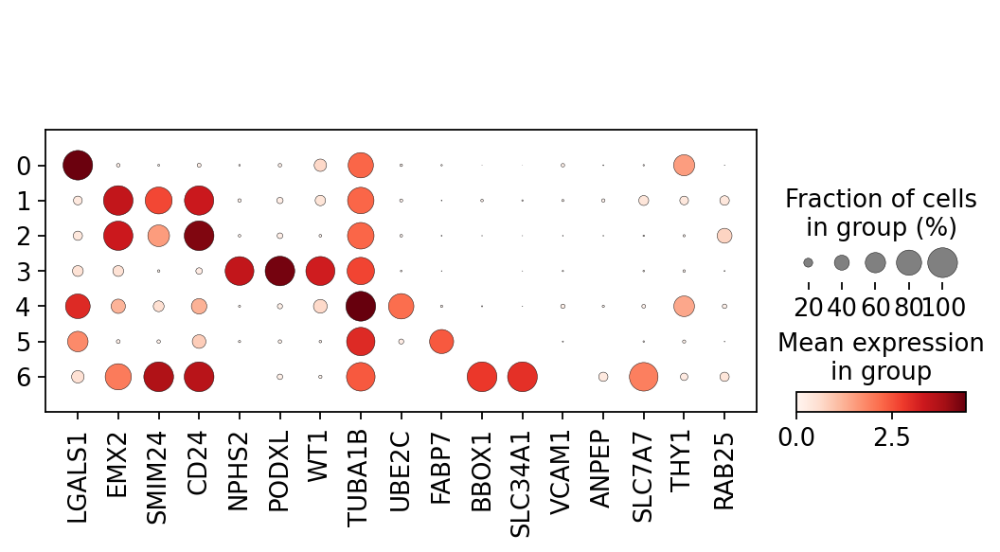

In [81]:
sc.pl.dotplot(adata, marker_genes, groupby='leiden_0.2')



In [84]:
new_cluster_names = [
    'endothelial cells', 
    'tubule cells', 
    'CD24 tubule cells',
    'podocytes',
    'fibroblast',
    'proximal tubule cells',
    'proximal tubules'
    ]
adata.rename_categories('leiden_0.2', new_cluster_names)

/home/lijunma/anaconda3/envs/RNAseq/lib/python3.9/site-packages/anndata/_core/anndata.py:1160: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  self.obs[key].cat.rename_categories(categories, inplace=True)


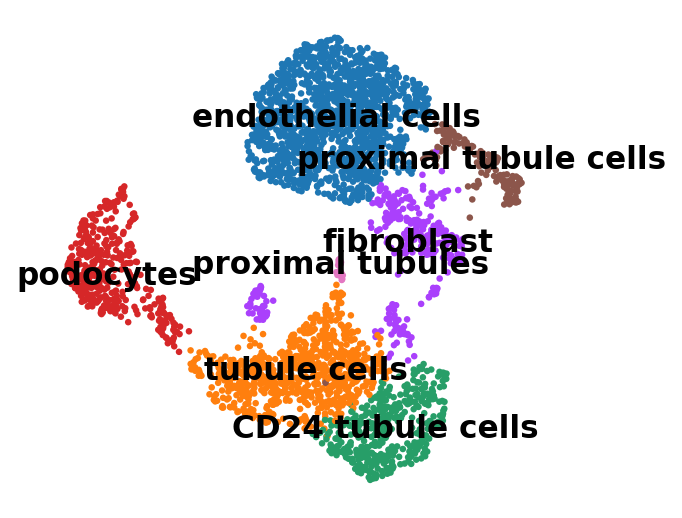

In [86]:
sc.pl.umap(adata, color='leiden_0.2', legend_loc='on data', title='', frameon=False, save='kidney_cell.pdf')

In [105]:
adata.uns

OverloadedDict, wrapping:
	{'hvg': {'flavor': 'seurat'}, 'leiden': {'params': {'n_iterations': -1, 'random_state': 0, 'resolution': 1}}, 'leiden_colors': array(['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b',
       '#e377c2', '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a',
       '#ff9896', '#c5b0d5', '#c49c94', '#f7b6d2', '#dbdb8d', '#9edae5',
       '#ad494a'], dtype=object), 'log1p': {}, 'neighbors': {'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'method': 'umap', 'metric': 'euclidean', 'n_neighbors': 10, 'n_pcs': 15, 'random_state': 0}}, 'pca': {'params': {'use_highly_variable': True, 'zero_center': True}, 'variance': array([97.39715  , 84.04947  , 38.271935 , 22.06395  , 15.448433 ,
       13.237154 ,  9.96704  ,  7.917936 ,  7.5601807,  7.388224 ,
        7.0579214,  6.5895095,  6.256437 ,  5.742219 ,  4.845051 ,
        4.562293 ,  4.484017 ,  4.354632 ,  4.176227 ,  4.1147323,
        3.8997438,  3.794632 ,  3.7423472

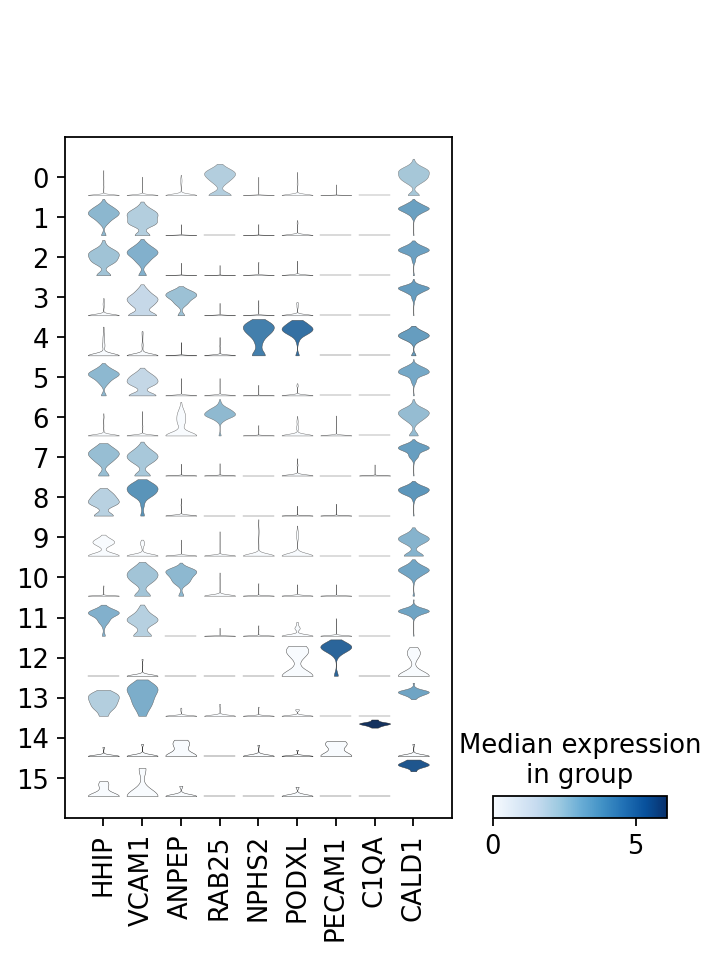

In [73]:
sc.pl.stacked_violin(adata, marker_genes, groupby='leiden', rotation=90);



In [53]:
adata.var

,gene_ids,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm,mean,std
SAMD11,ENSG00000187634,1258,False,1258,0.801789,63.704559,2779.0,True,1.526229,2.649695,1.570519,4.440245e-10,1.108304
KLHL17,ENSG00000187961,74,False,74,0.021639,97.864974,75.0,True,0.107657,1.886923,0.746929,-1.396984e-10,0.261654
ISG15,ENSG00000187608,706,False,706,0.288517,79.630698,1000.0,True,0.876893,2.267637,1.809354,2.913575e-10,0.804645
TTLL10,ENSG00000162571,12,False,12,0.004039,99.653780,14.0,True,0.016683,1.875158,0.699140,4.967600e-11,0.101325
TNFRSF4,ENSG00000186827,49,False,49,0.017023,98.586267,59.0,True,0.071450,1.887392,0.748833,1.849206e-10,0.211675
...,...,...,...,...,...,...,...,...,...,...,...,...,...
UBE2G2,ENSG00000184787,915,False,915,0.375361,73.600692,1301.0,True,0.943884,1.977862,0.640360,2.096484e-10,0.824672
LINC01547,ENSG00000183250,42,False,42,0.012406,98.788229,43.0,True,0.055303,1.885900,0.742772,-5.913159e-12,0.184717
LL21NC02-21A1.1,ENSG00000273796,69,False,69,0.020773,98.009233,72.0,True,0.089099,1.903342,0.813616,1.101998e-10,0.235644
C21orf58,ENSG00000160298,308,False,308,0.124639,91.113676,432.0,True,0.370094,1.847123,0.585270,-1.820984e-11,0.493018


In [54]:
adata.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
AAACCTGAGACTAGGC-1,3308,3306,9085.0,291.0,3.203082,11
AAACCTGAGAGCTGGT-1,2146,2146,5905.0,456.0,7.722269,0
AAACCTGCAGTGGAGT-1,2573,2572,7757.0,31.0,0.399639,8
AAACCTGCATTCCTGC-1,1373,1371,2889.0,37.0,1.280720,6
AAACCTGTCACTTCAT-1,3899,3898,13398.0,379.0,2.828780,8
...,...,...,...,...,...,...
TTTGTCAGTCACACGC-1,1572,1572,4475.0,153.0,3.418994,1
TTTGTCAGTCCAGTTA-1,1670,1670,4268.0,106.0,2.483599,9
TTTGTCAGTTCGTCTC-1,1809,1809,5066.0,90.0,1.776550,6
TTTGTCATCACTTACT-1,2998,2996,8023.0,40.0,0.498567,13


In [55]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from matplotlib import pyplot as plt
%matplotlib inline



In [56]:
adata = sc.read(results_file)

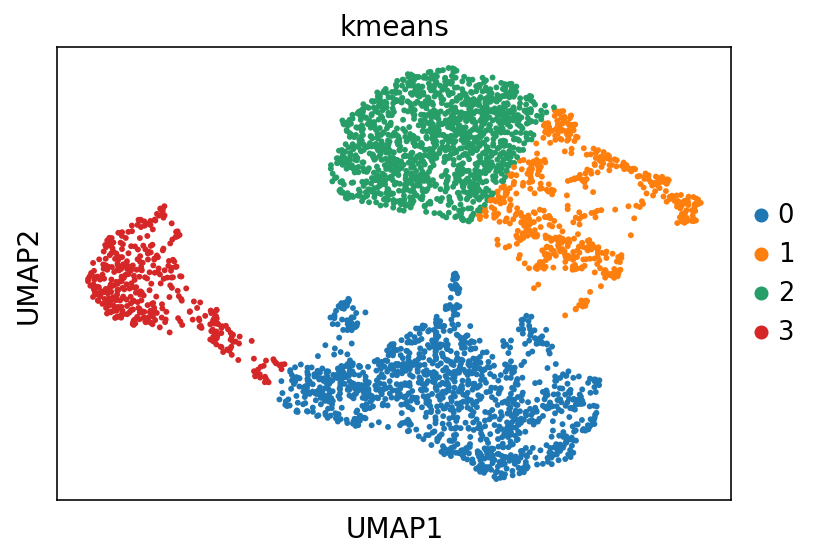

In [81]:
umap_coordinates = adata.obsm['X_umap'] # extract the UMAP coordinates for each cell
kmeans = KMeans(n_clusters=4, random_state=0).fit(umap_coordinates) # fix the random state for reproducibility

adata.obs['kmeans'] = kmeans.labels_ # retrieve the labels and add them as a metadata column in our AnnData object
adata.obs['kmeans'] = adata.obs['kmeans'].astype(str)

sc.pl.umap(adata, color='kmeans') # plot the results

computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE


/home/lijunma/anaconda3/envs/RNAseq/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


    finished (0:00:12)


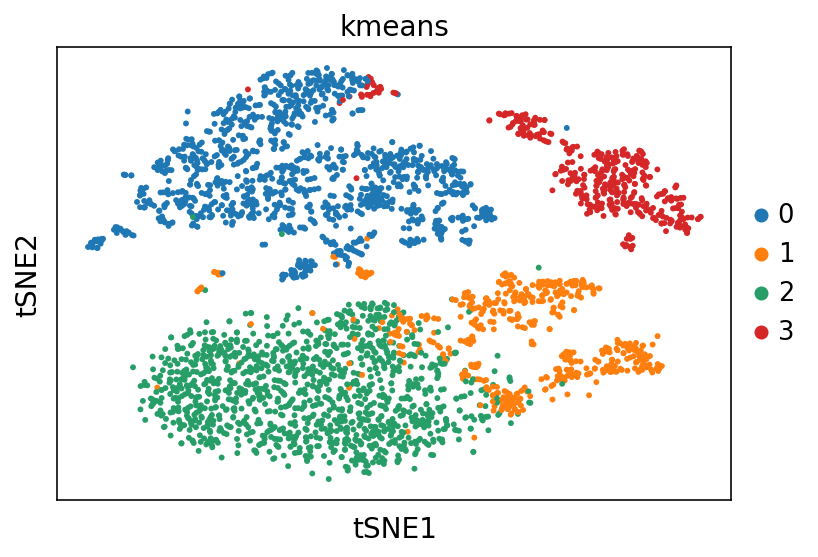

In [84]:
sc.tl.tsne(adata, perplexity=10, learning_rate=10000, random_state=0)
sc.pl.tsne(adata, color='kmeans')

In [86]:
adata

AnnData object with n_obs × n_vars = 3465 × 2799
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'kmeans'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'kmeans_colors', 'tsne'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [70]:
adata.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,kmeans
AAACCTGAGACTAGGC-1,3308,3306,9085.0,291.0,3.203082,11,1
AAACCTGAGAGCTGGT-1,2146,2146,5905.0,456.0,7.722269,0,0
AAACCTGCAGTGGAGT-1,2573,2572,7757.0,31.0,0.399639,8,1
AAACCTGCATTCCTGC-1,1373,1371,2889.0,37.0,1.280720,6,2
AAACCTGTCACTTCAT-1,3899,3898,13398.0,379.0,2.828780,8,1
...,...,...,...,...,...,...,...
TTTGTCAGTCACACGC-1,1572,1572,4475.0,153.0,3.418994,1,2
TTTGTCAGTCCAGTTA-1,1670,1670,4268.0,106.0,2.483599,9,2
TTTGTCAGTTCGTCTC-1,1809,1809,5066.0,90.0,1.776550,6,2
TTTGTCATCACTTACT-1,2998,2996,8023.0,40.0,0.498567,13,0


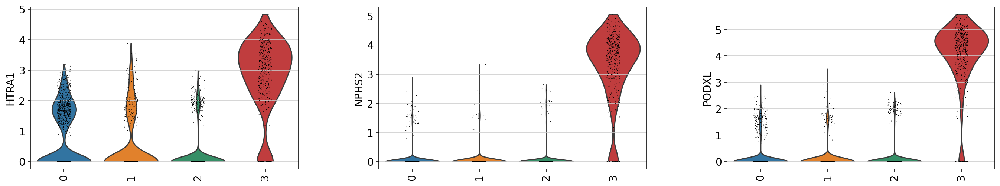

In [60]:
sc.pl.violin(adata, ['HTRA1', 'NPHS2', 'PODXL'], groupby='kmeans', rotation = 90)

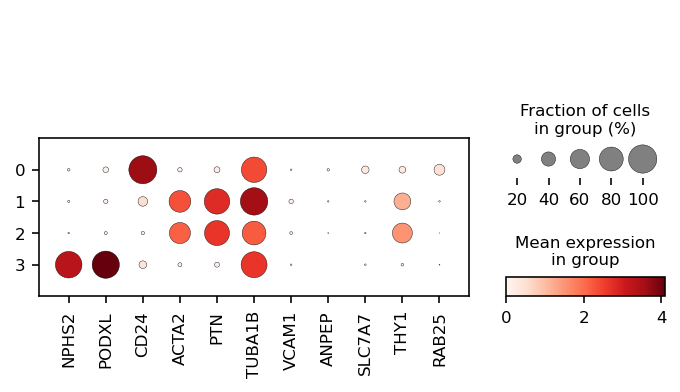

In [63]:
sc.pl.dotplot(adata, marker_genes, groupby='kmeans')

In [64]:
adata.uns

OverloadedDict, wrapping:
	{'hvg': {'flavor': 'seurat'}, 'leiden': {'params': {'n_iterations': -1, 'random_state': 0, 'resolution': 1}}, 'leiden_colors': array(['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b',
       '#e377c2', '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a',
       '#ff9896', '#c5b0d5', '#c49c94', '#f7b6d2', '#dbdb8d'],
      dtype=object), 'log1p': {}, 'neighbors': {'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'method': 'umap', 'metric': 'euclidean', 'n_neighbors': 10, 'n_pcs': 15, 'random_state': 0}}, 'pca': {'params': {'use_highly_variable': True, 'zero_center': True}, 'variance': array([97.767265 , 84.007805 , 37.94771  , 22.093433 , 16.015244 ,
       13.739627 , 10.242299 ,  8.595843 ,  7.902049 ,  7.434208 ,
        7.1760154,  6.6450586,  6.4181848,  5.76922  ,  5.585087 ,
        4.8227315,  4.561224 ,  4.363019 ,  4.3105407,  4.113465 ,
        3.9596057,  3.8730614,  3.7751842,  3.6707075,  3.595551

In [67]:
dataframe

,0_n,0_l,0_p,1_n,1_l,1_p,2_n,2_l,2_p,3_n,...,13_p,14_n,14_l,14_p,15_n,15_l,15_p,16_n,16_l,16_p
0,MT1F,5.784678,3.491911e-176,COL1A1,3.557686,4.143358e-98,PCP4,5.387048,6.364336e-149,GADD45A,...,1.774951e-53,CTGF,5.010409,2.361370e-42,PODXL,7.213775,9.010116e-19,MT-ATP6,2.892977,1.696608e-19
1,SMIM24,4.686786,1.486507e-158,DCN,3.526487,6.349219e-96,TSC22D1,2.431880,1.573005e-116,PTPRO,...,6.657106e-53,IGFBP7,3.521385,1.123969e-37,PTH1R,5.259585,1.519384e-18,FTL,2.279498,1.696608e-19
2,MT1G,6.313043,9.965117e-153,CXCL12,3.431302,9.695265e-95,IGFBP7,2.538116,2.029626e-113,PODXL,...,1.197417e-47,BCAM,3.858612,3.037550e-33,NPHS2,6.586711,1.519384e-18,MT-CO3,2.782297,1.696608e-19
3,MT1E,5.911474,4.059937e-150,PTN,3.428567,9.695265e-95,EMX2,4.009550,3.156405e-110,TPPP3,...,1.595286e-46,ARHGAP29,3.596896,9.510420e-33,PTPRO,6.289622,1.519384e-18,MT-CO1,2.452483,1.696608e-19
4,MT2A,5.435877,1.321639e-141,CLDN11,3.595777,3.171532e-94,ATP1B1,3.300356,1.029858e-103,MAFB,...,2.906511e-43,SPARC,1.839690,3.163318e-29,NTNG1,5.487500,2.521272e-18,APOE,5.041762,2.040613e-19
5,MPC2,3.150421,1.662391e-136,MFAP4,2.980423,9.307736e-94,BCAM,3.202922,8.452365e-95,MPP5,...,5.486744e-42,GPX3,4.814546,2.920703e-27,MPP5,5.617234,3.677313e-18,MT-ND3,2.936125,2.040613e-19
6,CLU,3.931906,9.142358e-136,COL3A1,3.588867,8.978720e-90,ID1,2.853105,1.442010e-92,WT1,...,5.564133e-40,MAFB,4.194390,3.227674e-27,SOST,6.174148,5.796599e-18,MT-ND2,2.358887,2.093938e-19
7,FLRT3,3.811743,3.400585e-134,SULT1E1,2.963699,1.465451e-80,PAX8,3.154466,2.239253e-90,NPHS2,...,1.249274e-39,VAMP8,3.409252,3.722022e-26,DDN,6.155626,5.796599e-18,CUBN,6.459630,2.359864e-19
8,MT1H,6.389553,2.047648e-131,TSHZ2,2.876389,1.192849e-75,CDH6,3.304314,1.308627e-87,CLIC5,...,1.249274e-39,ITM2C,1.842184,3.722022e-26,NES,4.613395,8.226956e-18,MT-ND4,2.405638,2.769913e-19
9,TMEM176A,3.659182,6.526458e-125,IGFBP5,3.289736,5.972743e-73,ID4,2.294613,1.172786e-80,TCF21,...,3.961865e-39,HES4,2.268530,5.421245e-24,MAFB,5.233801,8.226956e-18,MT-CYB,2.602328,2.900592e-19
